In [7]:
import cv2
import numpy as np
import matplotlib . pyplot as plt
from materialy_feature_points import pm

In [8]:
def harris(img, size):
    scale = 1
    delta = 0
    K = 0.05
    ddepth = cv2.CV_32F


    grad_x = cv2.Sobel(img, ddepth, 1, 0, ksize=size)
    grad_y = cv2.Sobel(img, ddepth, 0, 1, ksize=size)

    height, width = img.shape
    M = np.zeros((height, width, 2, 2))

    M[:, :, 0, 0] = cv2.GaussianBlur(grad_x**2, (size, size), 0)
    M[:, :, 0, 1] = cv2.GaussianBlur(grad_x * grad_y, (size, size), 0)
    M[:, :, 1, 0] = cv2.GaussianBlur(grad_x * grad_y, (size, size), 0)
    M[:, :, 1, 1] = cv2.GaussianBlur(grad_y**2, (size, size), 0)

    det_M = M[:, :, 0, 0] * M[:, :, 1, 1] - M[:, :, 0, 1] * M[:, :, 1, 0]
    trace_M = M[:, :, 0, 0] + M[:, :, 1, 1]

    H = det_M - K * trace_M**2

    H = cv2.normalize(H, None, 0, 1, cv2.NORM_MINMAX)
    return H


In [9]:
import scipy.ndimage.filters as filters

def find_max(image, size, threshold):
    data_max = filters.maximum_filter(image, size)
    maxima = (image==data_max)
    diff = image>threshold
    maxima[diff == 0] = 0 
    return np.nonzero(maxima)


(-0.5, 769.5, 777.5, -0.5)

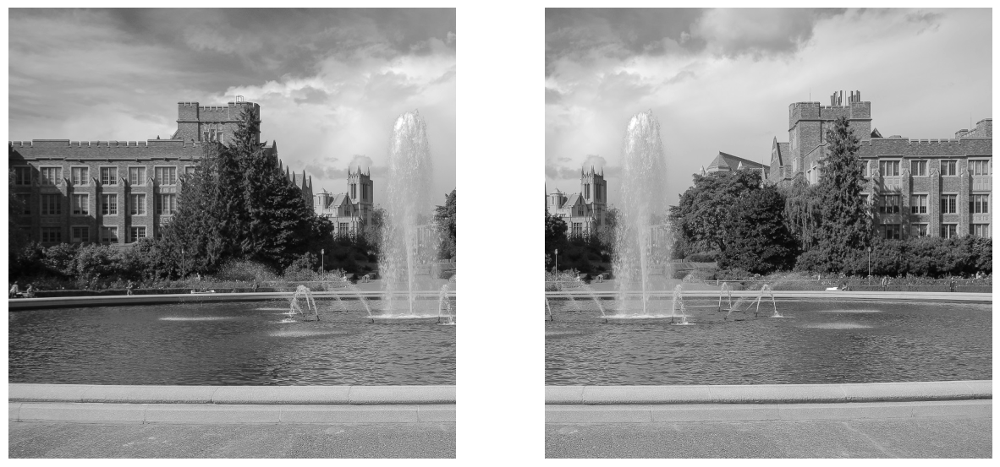

In [10]:
img1 = cv2.imread('materialy_feature_points/fontanna1.jpg')
img2 = cv2.imread('materialy_feature_points/fontanna2.jpg')

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

fig, axs = plt.subplots(1, 2, figsize=(15, 15))

axs[0].imshow(gray1, cmap="gray")
axs[0].axis("off")

axs[1].imshow(gray2, cmap="gray")
axs[1].axis("off")

## 6.1 Harris Method

In [11]:
def draw_maximas(img, x, y):
    plt.figure(figsize=(15, 15))
    plt.plot(y, x, 'r*')
    plt.imshow(img, cmap="gray")
    plt.axis("off")

/var/folders/_d/frt15l7163185k5vhp591tgm0000gn/T/ipykernel_54918/3363052452.py:4: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  data_max = filters.maximum_filter(image, size)


(-0.5, 769.5, 777.5, -0.5)

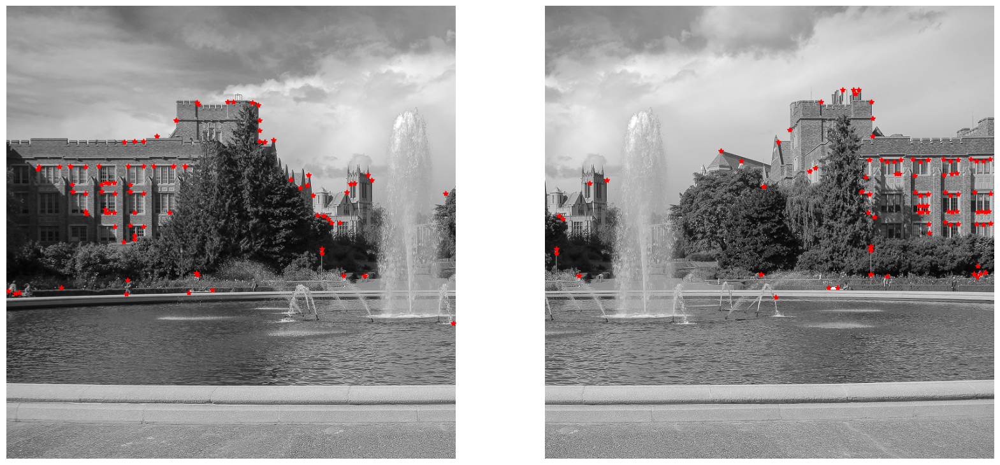

In [12]:
img1 = cv2.imread('materialy_feature_points/fontanna1.jpg')
img2 = cv2.imread('materialy_feature_points/fontanna2.jpg')

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

H1 = harris(gray1, 7)
H2 = harris(gray2, 7)

x1, y1 = find_max(H1, 7, 0.5)
x2, y2 = find_max(H2, 7, 0.5)

fig, axs = plt.subplots(1, 2, figsize=(20, 20))

axs[0].imshow(gray1, cmap="gray")
axs[0].plot(y1, x1, 'r*')
axs[0].axis("off")

axs[1].imshow(gray2, cmap="gray")
axs[1].plot(y2, x2, 'r*')
axs[1].axis("off")



/var/folders/_d/frt15l7163185k5vhp591tgm0000gn/T/ipykernel_54918/3363052452.py:4: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  data_max = filters.maximum_filter(image, size)


(-0.5, 799.5, 599.5, -0.5)

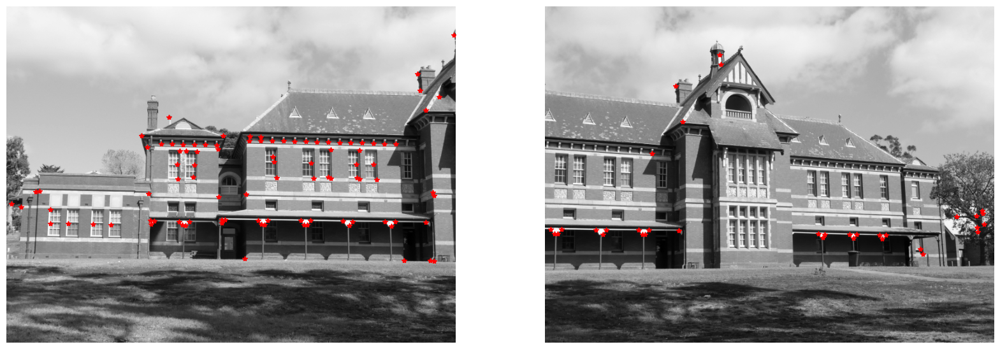

In [13]:
img1 = cv2.imread('materialy_feature_points/budynek1.jpg')
img2 = cv2.imread('materialy_feature_points/budynek2.jpg')

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

H1 = harris(gray1, 7)
H2 = harris(gray2, 7)

x1, y1 = find_max(H1, 7, 0.5)
x2, y2 = find_max(H2, 7, 0.5)

fig, axs = plt.subplots(1, 2, figsize=(20, 20))

axs[0].imshow(gray1, cmap="gray")
axs[0].plot(y1, x1, 'r*')
axs[0].axis("off")

axs[1].imshow(gray2, cmap="gray")
axs[1].plot(y2, x2, 'r*')
axs[1].axis("off")



## 6.2 Descritpion

In [14]:
def description(img, x, y, size, aff=False):
    Y, X = img.shape
    pts = list(filter(lambda pt: pt[0] >= size and pt[0] < Y-size and pt[1] >= size and pt[1] < X-size, zip(y, x)))
    
    neighbourhoods = []
    for cy, cx in pts:
        window = img[cy-size:cy+size,cx-size:cx+size]
        if aff:
            m = np.mean(window)
            s = np.std(window)
            window = (window - m) / s
        neighbourhoods.append(window.flatten())
    
    zipped = zip(pts, neighbourhoods)
    return list(zipped)

In [15]:
def calc_vec_norm(v1, v2):
    return np.linalg.norm(v1 - v2)

def calc_vec_distance(v1, v2):
    return np.sqrt(np.sum((np.square(v1 - v2))))

def calc_scalar_product(v1, v2):
    return np.dot(v1, v2)

In [16]:
def find_fitting_points(neighbourhoods1, neighbourhoods2, n, calc_distance):    
    vec = []
    for vic1 in neighbourhoods1:
        points1, window1 = vic1
        minDistance = float('inf')
        minPoints = (0, 0)
        
        for vic2 in neighbourhoods2:
            points2, window2 = vic2
            distance = calc_distance(window1, window2)
            if distance < minDistance:
                minDistance = distance
                minPoints = points2
        vec.append((minDistance, (points1, minPoints)))

    # sorting by distance
    vec.sort(key = lambda x: x[0])
    res = list(map(lambda x: x[1], vec[:n]))     
    return res  


In [17]:
def appendimages(im1,im2):    
    rows1 = im1.shape[0]    
    rows2 = im2.shape[0]
    
    if rows1 < rows2:
        im1 = np.concatenate((im1,np.zeros((rows2-rows1,im1.shape[1]))),axis=0)
    elif rows1 > rows2:
        im2 = np.concatenate((im2,np.zeros((rows1-rows2,im2.shape[1]))),axis=0)
    
    return np.concatenate((im1,im2), axis=1) 

In [18]:
def plot_matches(im1,im2,matches):
    colors=['r','g','b','c','m','y']
    im3 = appendimages(im1,im2)
    
    plt.figure(figsize=(20, 10))
    plt.imshow(im3, cmap='gray')
    
    cols1 = im1.shape[1]
    for i, m in enumerate(matches):
            plt.plot([m[0][1],m[1][1]+cols1],[m[0][0],m[1][0]],colors[i%6], linewidth=1)
    plt.axis('off') 

/var/folders/_d/frt15l7163185k5vhp591tgm0000gn/T/ipykernel_54918/3363052452.py:4: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  data_max = filters.maximum_filter(image, size)


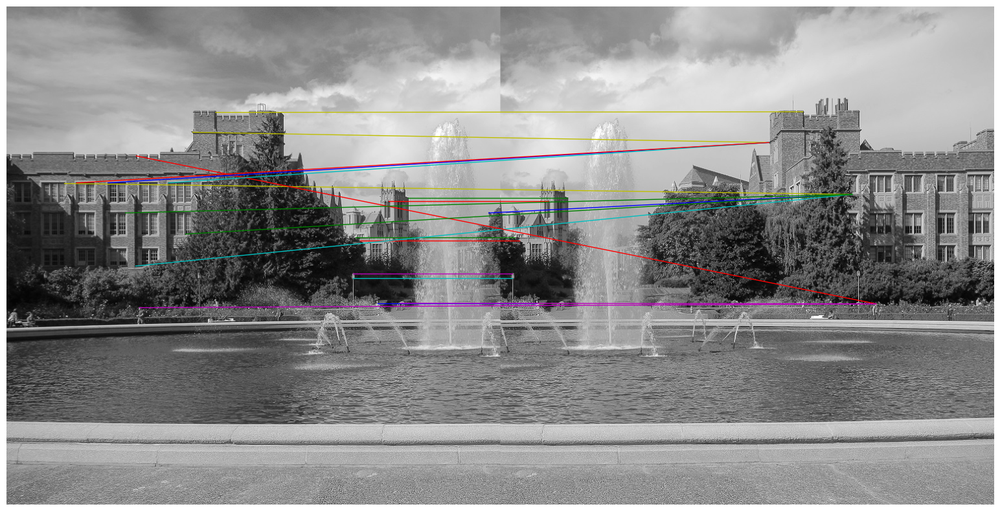

In [19]:
img1 = cv2.imread('materialy_feature_points/fontanna1.jpg')
img2 = cv2.imread('materialy_feature_points/fontanna2.jpg')

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

H1 = harris(gray1, 7)
H2 = harris(gray2, 7)

y1, x1 = find_max(H1, 7, 0.5)
y2, x2 = find_max(H2, 7, 0.5)

neigh1 = description(H1, x1, y1, 15)
neigh2 = description(H2, x2, y2, 15)

res = find_fitting_points(neigh1, neigh2, 20, calc_vec_norm)

plot_matches(gray1, gray2, res)




/var/folders/_d/frt15l7163185k5vhp591tgm0000gn/T/ipykernel_54918/3363052452.py:4: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  data_max = filters.maximum_filter(image, size)


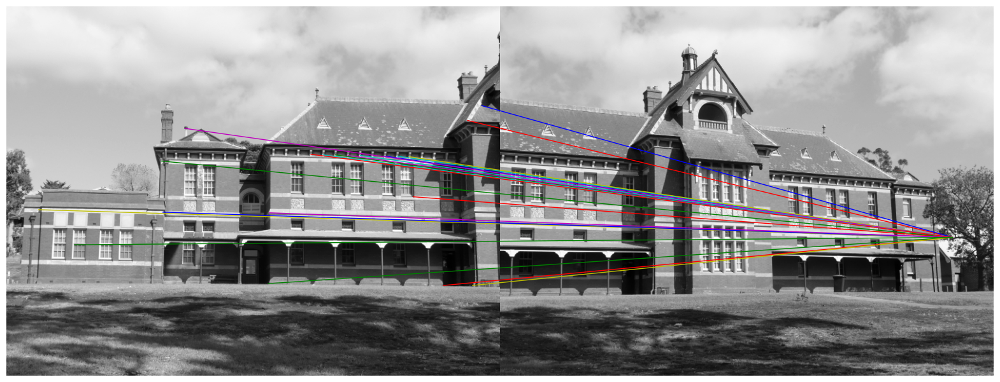

In [20]:
img1 = cv2.imread('materialy_feature_points/budynek1.jpg')
img2 = cv2.imread('materialy_feature_points/budynek2.jpg')

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

H1 = harris(gray1, 7)
H2 = harris(gray2, 7)

y1, x1 = find_max(H1, 7, 0.5)
y2, x2 = find_max(H2, 7, 0.5)

neigh1 = description(H1, x1, y1, 15)
neigh2 = description(H2, x2, y2, 15)

res = find_fitting_points(neigh1, neigh2, 20, calc_vec_norm)

plot_matches(gray1, gray2, res)




/var/folders/_d/frt15l7163185k5vhp591tgm0000gn/T/ipykernel_54918/3363052452.py:4: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  data_max = filters.maximum_filter(image, size)


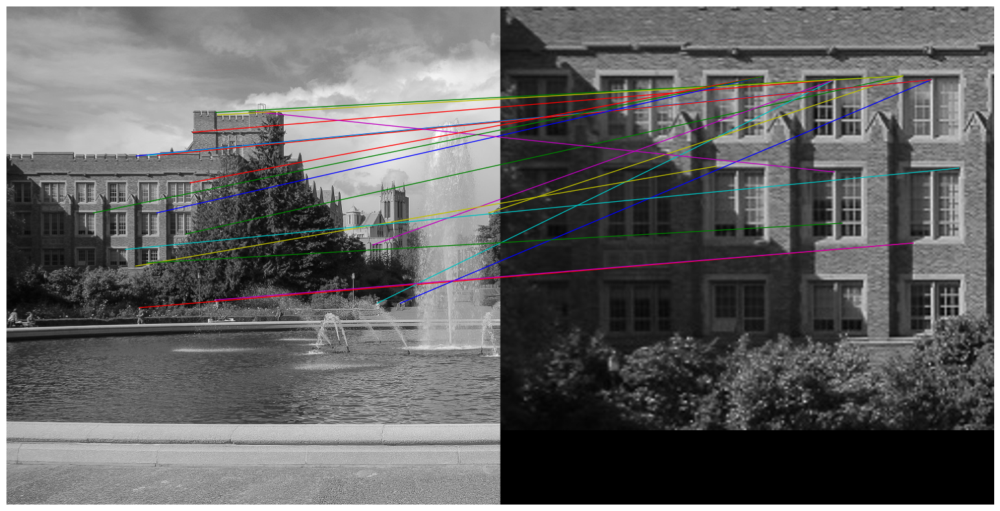

In [21]:
img1 = cv2.imread('materialy_feature_points/fontanna1.jpg')
img2 = cv2.imread('materialy_feature_points/fontanna_pow.jpg')

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

H1 = harris(gray1, 7)
H2 = harris(gray2, 7)

y1, x1 = find_max(H1, 7, 0.5)
y2, x2 = find_max(H2, 7, 0.5)

neigh1 = description(H1, x1, y1, 15)
neigh2 = description(H2, x2, y2, 15)

res = find_fitting_points(neigh1, neigh2, 20, calc_vec_norm)

plot_matches(gray1, gray2, res)




## afiniczne

/var/folders/_d/frt15l7163185k5vhp591tgm0000gn/T/ipykernel_54918/3363052452.py:4: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  data_max = filters.maximum_filter(image, size)


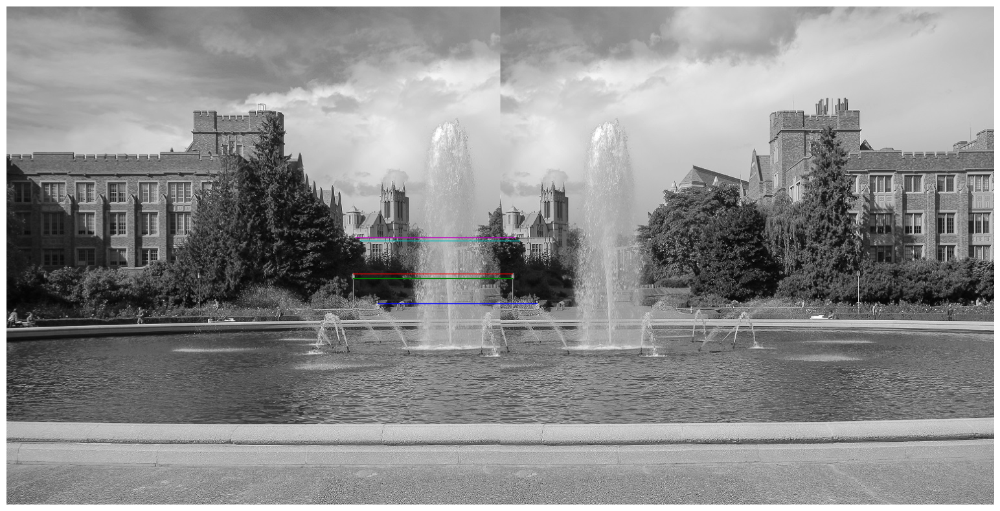

In [22]:
img1 = cv2.imread('materialy_feature_points/fontanna1.jpg')
img2 = cv2.imread('materialy_feature_points/fontanna2.jpg')

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

H1 = harris(gray1, 7)
H2 = harris(gray2, 7)

y1, x1 = find_max(H1, 7, 0.5)
y2, x2 = find_max(H2, 7, 0.5)

neigh1 = description(H1, x1, y1, 15, True)
neigh2 = description(H2, x2, y2, 15, True)

res = find_fitting_points(neigh1, neigh2, 20, calc_vec_norm)[:5]

plot_matches(gray1, gray2, res)




/var/folders/_d/frt15l7163185k5vhp591tgm0000gn/T/ipykernel_54918/3363052452.py:4: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  data_max = filters.maximum_filter(image, size)


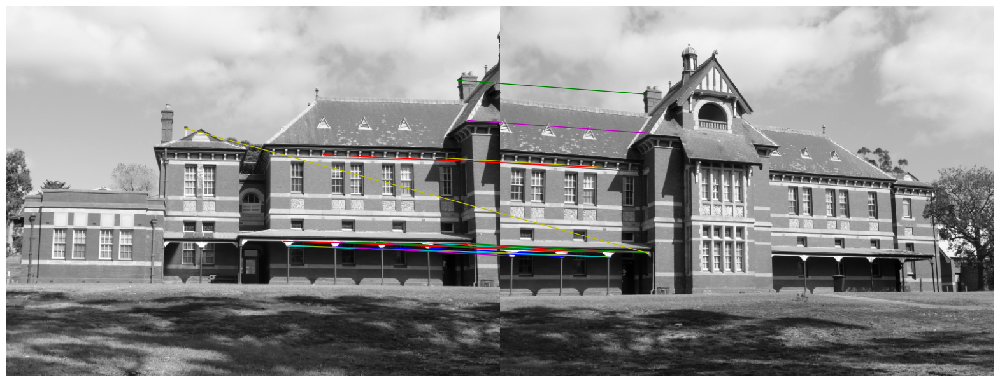

In [23]:
img1 = cv2.imread('materialy_feature_points/budynek1.jpg')
img2 = cv2.imread('materialy_feature_points/budynek2.jpg')

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

H1 = harris(gray1, 7)
H2 = harris(gray2, 7)

y1, x1 = find_max(H1, 7, 0.5)
y2, x2 = find_max(H2, 7, 0.5)

neigh1 = description(H1, x1, y1, 15, True)
neigh2 = description(H2, x2, y2, 15, True)

res = find_fitting_points(neigh1, neigh2, 20, calc_vec_norm)

plot_matches(gray1, gray2, res)




/var/folders/_d/frt15l7163185k5vhp591tgm0000gn/T/ipykernel_54918/3363052452.py:4: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  data_max = filters.maximum_filter(image, size)


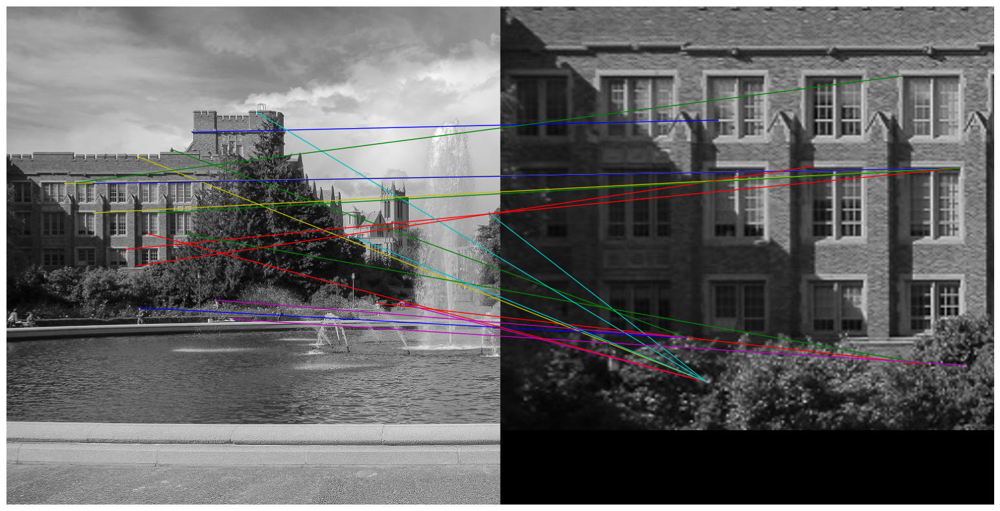

In [24]:
img1 = cv2.imread('materialy_feature_points/fontanna1.jpg')
img2 = cv2.imread('materialy_feature_points/fontanna_pow.jpg')

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

H1 = harris(gray1, 7)
H2 = harris(gray2, 7)

y1, x1 = find_max(H1, 7, 0.5)
y2, x2 = find_max(H2, 7, 0.5)

neigh1 = description(H1, x1, y1, 15, True)
neigh2 = description(H2, x2, y2, 15, True)

res = find_fitting_points(neigh1, neigh2, 20, calc_vec_norm)

plot_matches(gray1, gray2, res)




## 6.3 FAST

In [25]:
def pointHarris(img, size):
    K = 0.05
    ddepth = cv2.CV_32F


    grad_x = cv2.Sobel(img, ddepth, 1, 0, ksize=size)
    grad_y = cv2.Sobel(img, ddepth, 0, 1, ksize=size)

    print(grad_x)

    height, width = img.shape
    M = np.zeros((height, width, 2, 2))

    M[:, :, 0, 0] = cv2.GaussianBlur(grad_x**2, (size, size), 0)
    M[:, :, 0, 1] = cv2.GaussianBlur(grad_x * grad_y, (size, size), 0)
    M[:, :, 1, 0] = cv2.GaussianBlur(grad_x * grad_y, (size, size), 0)
    M[:, :, 1, 1] = cv2.GaussianBlur(grad_y**2, (size, size), 0)

    det_M = M[:, :, 0, 0] * M[:, :, 1, 1] - M[:, :, 0, 1] * M[:, :, 1, 0]
    trace_M = M[:, :, 0, 0] + M[:, :, 1, 1]

    H = det_M - K * trace_M**2

    H = cv2.normalize(H, None, 0, 1, cv2.NORM_MINMAX)
    return H


In [26]:
from collections import Counter

def fast(img, threshold, size=7):   
    n = 9
    Y, X = img.shape
    pts = [[-3, 0], [-3, 1], [-2, 2], [-1, 3], [0, 3], [1, 3], [2, 2], [3, 1], [3, 0], [3, -1], [2, -2], [1, -3], [0, -3], [-1, -3], [-2, -2], [-3, -1]]

    res = []

    im1 = pts[0]
    im2 = pts[4]
    im3 = pts[8]
    im4 = pts[12]

    def hasPotential(x, y):
        I = img[y][x]

        lower, upper = I - threshold, I + threshold

        p1 = img[y+im1[0]][x+im1[1]]
        p3 = img[y+im3[0]][x+im3[1]]

        p2 = img[y+im2[0]][x+im2[1]]
        p4 = img[y+im4[0]][x+im4[1]]

        cnt = Counter()
        for el in [p1, p2, p3, p4]:
            if el > upper:
                cnt[1] += 1
            elif el < lower:
                cnt[-1] += 1
        
        return cnt[1] >= 3 or cnt[-1] >= 2
        
            
    for y in range(size, Y-size):
        for x in range(size, X-size):
            cnt = Counter()
            I = img[y][x]

            if not hasPotential(x, y):
                continue

            for k in range(n):
                dy, dx = pts[k]
                if img[y+dy][x+dx] > I + threshold:
                    cnt[1] += 1
                if img[y+dy][x+dx] < I - threshold:
                    cnt[-1] += 1
            
            matched = False
            i = n
            for k in range(len(pts)):
                if cnt[1] == n or cnt[-1] == n:
                    matched = True
                    break 
                dy, dx = pts[i]
                if img[y+dy][x+dx] > I + threshold:
                    cnt[1] += 1
                if img[y+dy][x+dx] < I - threshold:
                    cnt[-1] += 1
                
                ri = i - n
                rdy, rdx = pts[ri]
                if img[y+rdy][x+rdx] > I + threshold:
                    cnt[1] -= 1
                if img[y+rdy][x+rdx] < I - threshold:
                    cnt[-1] -= 1
                

                i = (i + 1) % len(pts)

            if not matched:
                continue
            H = harris(img[y-size:y+size, x-size:x+size], 7)
            pointHarris = H[size // 2][size // 2]
            res.append((pointHarris, y, x))
       
    return res


In [27]:
import heapq

def nonMaximumSuppression(pts, size):
    # sort by x-axes
    pts.sort(key = lambda x: (x[1], x[2]))

    # (y, x)
    merged = (pts[0][1], pts[0][2])
    res = []
    heap = [(-1*pts[0][0], pts[0][1], pts[0][2])]

    for i in range(1, len(pts)):
        if abs(merged[0] - pts[i][1]) < size and abs(merged[1] - pts[i][2]) < size:
            merged = (max(merged[0], pts[i][1]), max(merged[1], pts[i][2]))

            n_val = (-1*pts[i][0], pts[i][1], pts[i][2])
            heapq.heappush(heap, n_val)
        else:
            best = heapq.heappop(heap)
            res.append((-1*best[0], best[1], best[2]))
            merged = (pts[i][1], pts[i][2])
            heap = [(-1*pts[i][0], pts[i][1], pts[i][2])]

    best = heapq.heappop(heap)
    res.append((-1*best[0], best[1], best[2]))
    return res
    
# nonMaximumSuppression([(1, 2, 5), (2, 2, 4), (5, 2, 3), (1, 5, 2), (2, 10, 10)], 3)

In [28]:
def filter_points(pts, Y, X, size):
    return list(filter(lambda pt: pt[1] >= size and pt[1] < Y-size and pt[2] >= size and pt[2] < X-size, pts))

In [29]:
def get_best(pts, n):
    pts.sort(key = lambda x: x[0], reverse=True)
    return pts[:n]

In [30]:
def moment(img, pt, r):
    y, x = pt
    m00 = np.sum(img[y-r:y+r+1, x-r:x+r+1])

    m01 = 0
    for i in range(-r, r+1):
        cy = y + i
        for j in range(-r, r+1):
            cx = x + j
            m01 += img[cy, cx] * cy
    
    m10 = 0
    for i in range(-r, r+1):
        cy = y + i
        for j in range(-r, r+1):
            cx = x + j
            m10 += img[cy, cx] * cx
    
    C = (m10 / m00, m01 / m00)
    phi = np.arctan2(m01, m10)

    return C, phi

def getPointsStats(img, pts, r):
    res = []
    for pt in pts:
        y, x = pt
        res.append(moment(img, (y, x), r))
    return res


In [31]:
import math

def brief(img, pt, phi):
    file = open('materialy_feature_points/orb_descriptor_positions.txt', 'r')

    y, x = pt
    vec = 0
    size = 31

    window = img[y-size:y+size+1,x-size:x+size+1]
    window = cv2.GaussianBlur(window, (5, 5), 0)

    cos_phi = math.cos(phi)
    sin_phi = math.sin(phi)
    
    for i in range(256):
        content = file.readline()
        dy1, dx1, dy2, dx2 = list(map(float, content.split()))
        dy1 = int(dy1)
        dy2 = int(dy2)
        dx1 = int(dx1)
        dx2 = int(dx2)

        dx1 = int(cos_phi * dx1 - sin_phi * dy1) 
        dy1 = int(sin_phi * dy1 + cos_phi * dx1)

        dx2 = int(cos_phi * dx2 - sin_phi * dy2)
        dy2 = int(sin_phi * dy2 + cos_phi * dx2)

        pt1 = img[size + dy1][size + dx1]
        pt2 = img[size + dy2][size + dx2]

        if pt1 < pt2:
            vec |= 1 << i

    return vec


def brief_description(img, pts, stats):
    res = []
    
    for i in range(len(pts)):
        y, x = pts[i]
        _, phi = stats[i]
        vec = brief(img, (y, x), phi)
        res.append(vec)
    
    return res


In [32]:
def find_by_hamming_distance(pts1, pts2, vectors1, vectors2, K):
    N = min(len(pts1), len(pts2))
    matchedPairs = []

    for i in range(N):
        vec1 = vectors1[i]
        bestScore = float('inf')
        bestFitPoints = (0, 0)
        y1, x1 = pts1[i]

        for k in range(N):
            vec2 = vectors2[k]
            cur = vec1 ^ vec2
            res = 0
            while cur:
                if cur & 1:
                    res += 1
                cur >>= 1
            
            if res < bestScore:
                bestScore = res
                y2, x2 = pts2[i]
                bestFitPoints = (y2, x2)
        
        matchedPairs.append([bestScore, (y1, x1), (bestFitPoints[0], bestFitPoints[1])])
    
    matchedPairs.sort(key=lambda el: el[0])
    matchedPairs = matchedPairs[:K]
    return list(map(lambda el: [el[1], el[2]], matchedPairs))


In [36]:
import math

def calc(img1, img2):
    fast1 = fast(img1, 150)
    fast2 = fast(img2, 150)

    suppressed1 = nonMaximumSuppression(fast1, 7)
    suppressed2 = nonMaximumSuppression(fast2, 7)

    filtered1 = filter_points(suppressed1, img1.shape[0], img1.shape[1], 31)
    filtered2 = filter_points(suppressed2, img2.shape[0], img2.shape[1], 31)

    best1 = get_best(filtered1, 20)
    best2 = get_best(filtered2, 20)

    best1 = list(map(lambda el: (el[1], el[2]), best1))
    best2 = list(map(lambda el: (el[1], el[2]), best2))

    stats1 = getPointsStats(img1, best1, 15)
    stats2 = getPointsStats(img2, best2, 15)

    vec1 = brief_description(img1, best1, stats1)
    vec2 = brief_description(img2, best2, stats2)

    matched = find_by_hamming_distance(best1, best2, vec1, vec2, 5)

    y1 = list(map(lambda x: x[0], best1))
    x1 = list(map(lambda x: x[1], best1))

    y2 = list(map(lambda x: x[0], best2))
    x2 = list(map(lambda x: x[1], best2))

    fig, axs = plt.subplots(1, 2, figsize=(20, 20))

    axs[0].imshow(img1, cmap="gray")
    axs[0].plot(x1, y1, 'r*')
    axs[0].axis("off")

    axs[1].imshow(img2, cmap="gray")
    axs[1].plot(x2, y2, 'r*')
    axs[1].axis("off")

    # # # scale up this points 
    # y1 = list(map(lambda x: math.ceil(x * 2), y1))
    # x1 = list(map(lambda x: math.ceil(x * 2), x1))

    # y2 = list(map(lambda x: math.ceil(x * 2), y2))
    # x2 = list(map(lambda x: math.ceil(x * 2), x2)
    
    # matched = list(map(lambda el: [(el[0][0] * 2, el[0][1] * 2), (el[1][0] * 2, el[1][1] * 2)], matched))
    # plot_matches(img1_orig, img2_orig, matched)

IndexError: list index out of range

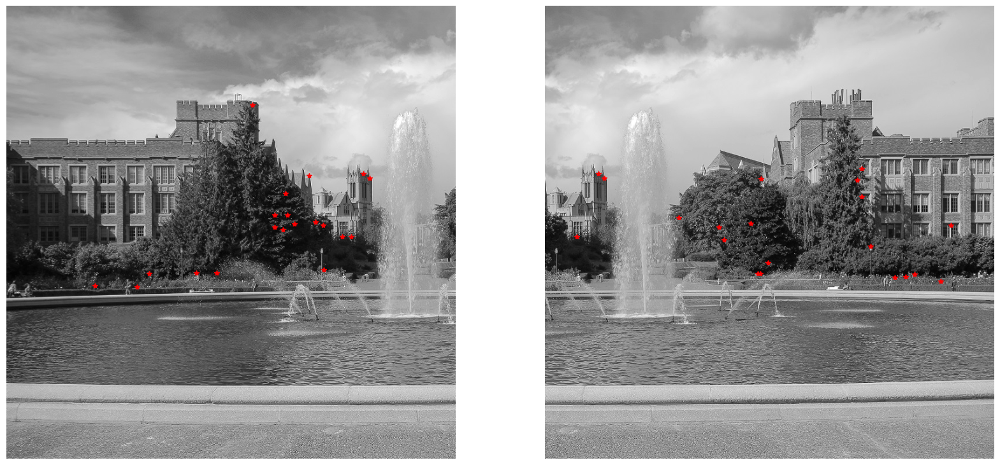

In [37]:
fontanna1 = cv2.imread('materialy_feature_points/fontanna1.jpg', cv2.IMREAD_GRAYSCALE)
fontanna2 = cv2.imread('materialy_feature_points/fontanna2.jpg', cv2.IMREAD_GRAYSCALE)

budynek1 = cv2.imread('materialy_feature_points/budynek1.jpg', cv2.IMREAD_GRAYSCALE)
budynek2 = cv2.imread('materialy_feature_points/budynek2.jpg', cv2.IMREAD_GRAYSCALE)


calc(fontanna1, fontanna2)
calc(budynek1, budynek2)


# fig, axs = plt.subplots(1, 2, figsize=(20, 20))

# axs[0].imshow(gray1, cmap="gray")
# # put coords here as text
# for i in range(len(y1)):
#     axs[0].text(x1[i], y1[i], f"{y1[i]} {x1[i]}", color="red") 

# axs[0].plot(x1, y1, 'r*')
# axs[0].axis("off")

# axs[1].imshow(gray2, cmap="gray")
# axs[1].plot(x2, y2, 'r*')
# axs[1].axis("off")


(-0.5, 769.5, 777.5, -0.5)

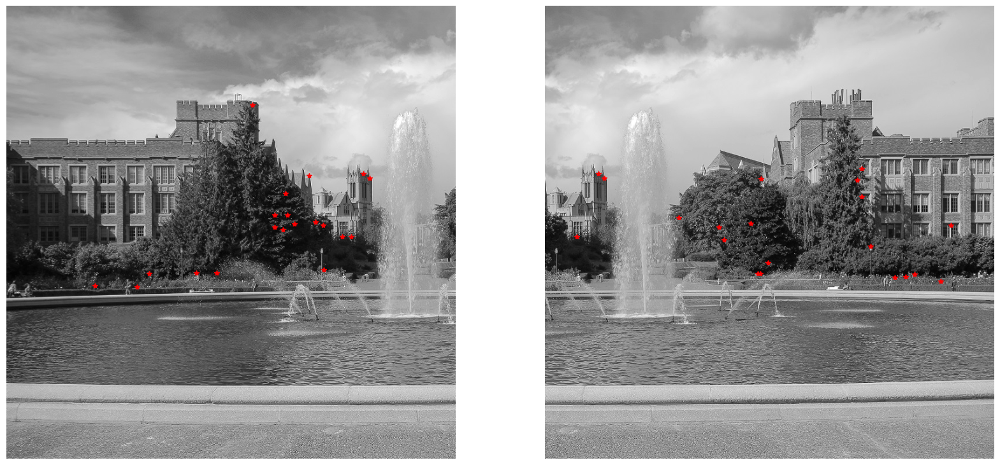

In [ ]:
img1 = cv2.imread('materialy_feature_points/fontanna1.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('materialy_feature_points/fontanna2.jpg', cv2.IMREAD_GRAYSCALE)

fast1 = fast(img1, 150)
fast2 = fast(img2, 150)

suppressed1 = nonMaximumSuppression(fast1, 7)
suppressed2 = nonMaximumSuppression(fast2, 7)

filtered1 = filter_points(suppressed1, img1.shape[0], img1.shape[1], 31)
filtered2 = filter_points(suppressed2, img2.shape[0], img2.shape[1], 31)


best1 = get_best(filtered1, 20)
best2 = get_best(filtered2, 20)

best1 = list(map(lambda el: (el[1], el[2]), best1))
best2 = list(map(lambda el: (el[1], el[2]), best2))


stats1 = getPointsStats(img1, best1, 15)
stats2 = getPointsStats(img2, best2, 15)

vec1 = brief_description(img1, best1, stats1)
vec2 = brief_description(img2, best2, stats2)

matched = find_by_hamming_distance(best1, best2, vec1, vec2, 5)

y1 = list(map(lambda x: x[0], best1))
x1 = list(map(lambda x: x[1], best1))

y2 = list(map(lambda x: x[0], best2))
x2 = list(map(lambda x: x[1], best2))


fig, axs = plt.subplots(1, 2, figsize=(20, 20))

axs[0].imshow(img1, cmap="gray")
axs[0].plot(x1, y1, 'r*')
axs[0].axis("off")

axs[1].imshow(img2, cmap="gray")
axs[1].plot(x2, y2, 'r*')
axs[1].axis("off")

(-0.5, 769.5, 777.5, -0.5)

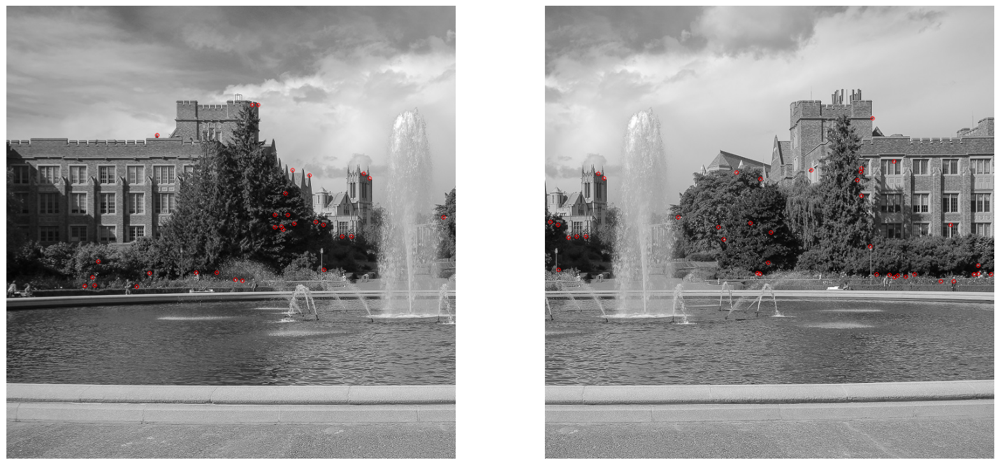

In [ ]:
img1 = cv2.imread('materialy_feature_points/fontanna1.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('materialy_feature_points/fontanna2.jpg', cv2.IMREAD_GRAYSCALE)

fast_detector = cv2.FastFeatureDetector_create(150)

kp1 = fast_detector.detect(img1, None)
kp2 = fast_detector.detect(img2, None)

img1 = cv2.drawKeypoints(img1, kp1, None, color=(255,0,0))
img2 = cv2.drawKeypoints(img2, kp2, None, color=(255,0,0))


fig, axs = plt.subplots(1, 2, figsize=(20, 20))

axs[0].imshow(img1, cmap="gray")
axs[0].axis("off")

axs[1].imshow(img2, cmap="gray")
axs[1].axis("off")

## 6.4 Connecting Images

(-0.5, 817.5, 709.5, -0.5)

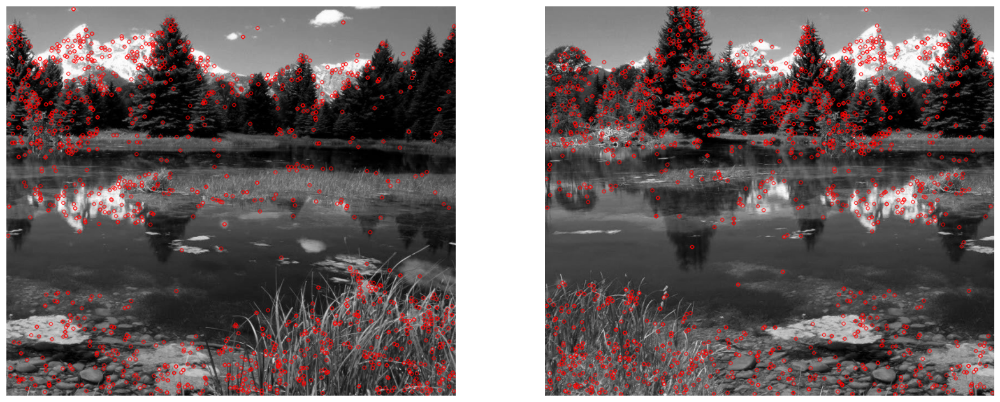

In [ ]:
img1 = cv2.imread('materialy_feature_points/left_panorama.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('materialy_feature_points/right_panorama.jpg', cv2.IMREAD_GRAYSCALE)

sift = cv2.SIFT_create(edgeThreshold=2.0)

kp1 = sift.detect(img1, None)
kp2 = sift.detect(img2, None)

img1 = cv2.drawKeypoints(img1, kp1, None, color=(255,0,0))
img2 = cv2.drawKeypoints(img2, kp2, None, color=(255,0,0))

fig, axs = plt.subplots(1, 2, figsize=(20, 10))

axs[0].imshow(img1, cmap="gray")
axs[0].axis("off")

axs[1].imshow(img2, cmap="gray")
axs[1].axis("off")


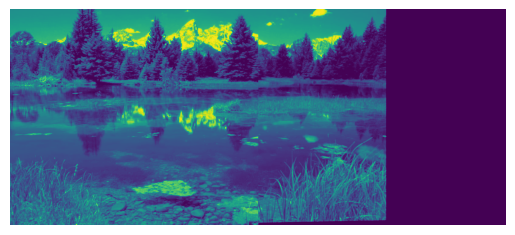

In [ ]:
img1 = cv2.imread('materialy_feature_points/left_panorama.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('materialy_feature_points/right_panorama.jpg', cv2.IMREAD_GRAYSCALE)

sift = cv2.SIFT_create()

kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

bf = cv2.BFMatcher(cv2.NORM_L2)
matches = bf.knnMatch(des1, des2, k=2)

best_matches = []

for m, n in matches:
    if m.distance < 0.5*n.distance:
        best_matches.append([m])

best_matches = best_matches[:10]

keypointsL = np.float32([kp.pt for kp in kp1])
keypointsR = np.float32([kp.pt for kp in kp2])

ptsA = np.float32([keypointsL[m[0].queryIdx] for m in best_matches])
ptsB = np.float32([keypointsR[m[0].trainIdx] for m in best_matches])

H, _ = cv2.findHomography(ptsA, ptsB)

width = img1.shape[1] + img2.shape[1]
height = max(img1.shape[0], img2.shape[0])

result = cv2.warpPerspective(img1, H, (width, height))
result[0:img2.shape[0], 0:img2.shape[1]] = img2

plt.imshow(result)
plt.axis("off")
plt.show()


## 6.5

In [ ]:
def siftCalc(img1, img2, k=0.5):
    sift = cv2.xfeatures2d.SIFT_create()
    kp1, des1 = sift.detectAndCompute(img1,None)
    kp2, des2 = sift.detectAndCompute(img2,None)

    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)

    best_matches = []

    for m, n in matches:
        if m.distance < k*n.distance:
            best_matches.append([m])

    best_matches = best_matches[:50]
    res = cv2.drawMatchesKnn(img1, kp1, img2, kp2, best_matches, None, flags=2)

    plt.imshow(res)
    plt.axis("off")

[ WARN:0@15.242] global /private/var/folders/k1/30mswbxs7r1g6zwn8y4fyt500000gp/T/abs_11nitadzeg/croot/opencv-suite_1691620374638/work/opencv_contrib-4.6.0/modules/xfeatures2d/misc/python/shadow_sift.hpp (15) SIFT_create DEPRECATED: cv.xfeatures2d.SIFT_create() is deprecated due SIFT tranfer to the main repository. https://github.com/opencv/opencv/issues/16736


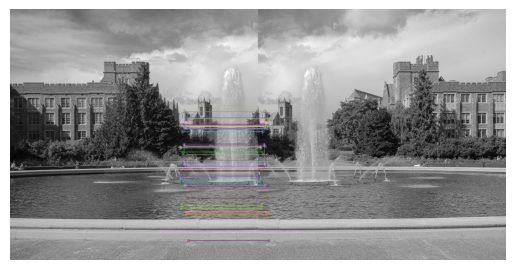

In [ ]:
img1 = cv2.imread('materialy_feature_points/fontanna1.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('materialy_feature_points/fontanna2.jpg', cv2.IMREAD_GRAYSCALE)

siftCalc(img1, img2)



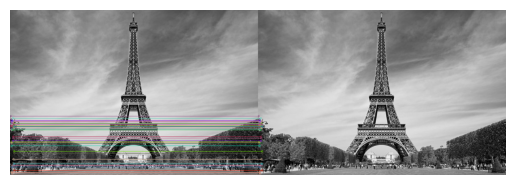

In [ ]:
img1 = cv2.imread('materialy_feature_points/eiffel1.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('materialy_feature_points/eiffel1.jpg', cv2.IMREAD_GRAYSCALE)

siftCalc(img1, img2, k=95)

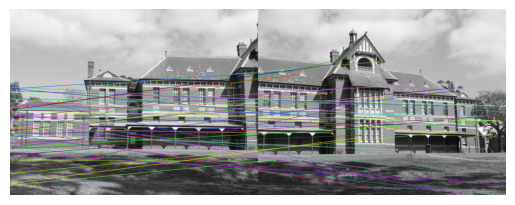

In [ ]:
img1 = cv2.imread('materialy_feature_points/budynek1.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('materialy_feature_points/budynek2.jpg', cv2.IMREAD_GRAYSCALE)

siftCalc(img1, img2, k=95)

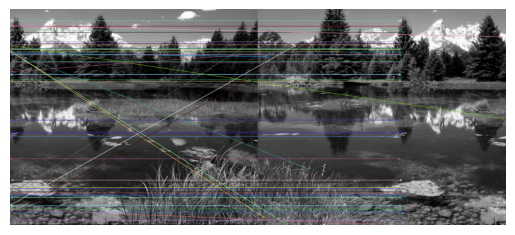

In [ ]:
img1 = cv2.imread('materialy_feature_points/left_panorama.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('materialy_feature_points/right_panorama.jpg', cv2.IMREAD_GRAYSCALE)

siftCalc(img1, img2, k=95)